In [1]:
import pandas as pd
import plotly.io as pio

from plotting import line_plot, choropleth_map, comparative_bar, climate_plot

# Set the default figure renderer to use plotly.js from CDN, and greatly reduce
# the notebook file-size. See https://plotly.com/python/renderers/
pio.renderers.default = "notebook_connected+jupyterlab"

In [2]:
# Time series data for each region, 1901-2020
precipitation_ts = pd.read_csv("precipitation_time_series.csv", index_col=0)
temperature_ts = pd.read_csv("temperature_time_series.csv", header=[0, 1], index_col=0)

# Climatology data, 1961-1990 & 1991-2020
precipitation_climatology = pd.read_csv("precipitation_climatology.csv", header=[0, 1], index_col=0)
temperature_climatology = pd.read_csv("temperature_climatology.csv", header=[0, 1], index_col=0)

# 1. Trends in temperature 

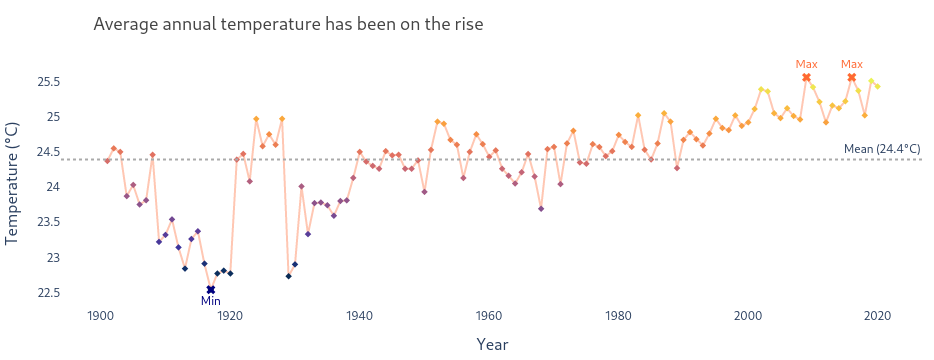

In [3]:
line_plot(temperature_ts[("mean_temp", "Kenya")], line_color="#ffc7b3", max_color="#ff6933",
          min_color="navy", marker_colorscale="thermal", hover_text="Avg. Temperature",
          x_label="Year", y_label="Temperature (&deg;C)", unit="&deg;C",
          title="Average annual temperature has been on the rise")

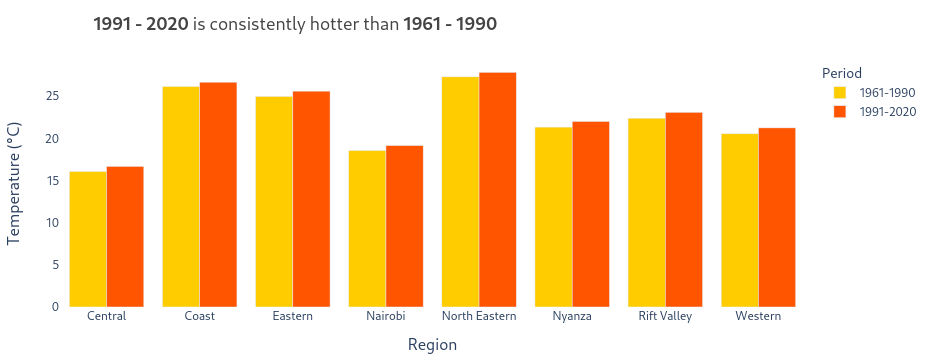

In [4]:
temp_climate = temperature_climatology.stack().groupby(level=0).mean()
comparative_bar(temp_climate, unit="&deg;C", x_label="Region", y_label="Temperature",
                color_sequence=["#ffcc00", "#ff5500"], legend_title_text="Period",
                title="<b>1991 - 2020</b> is consistently hotter than <b>1961 - 1990</b>")

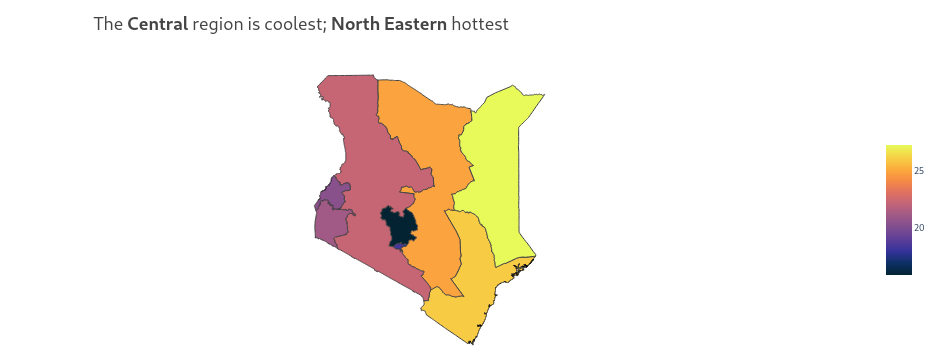

In [5]:
choropleth_map(temperature_ts["mean_temp"].mean(), color_scale="thermal", unit="&deg;C",
               title="The <b>Central</b> region is coolest; <b>North Eastern</b> hottest")

# 2. Trends in Precipitation 

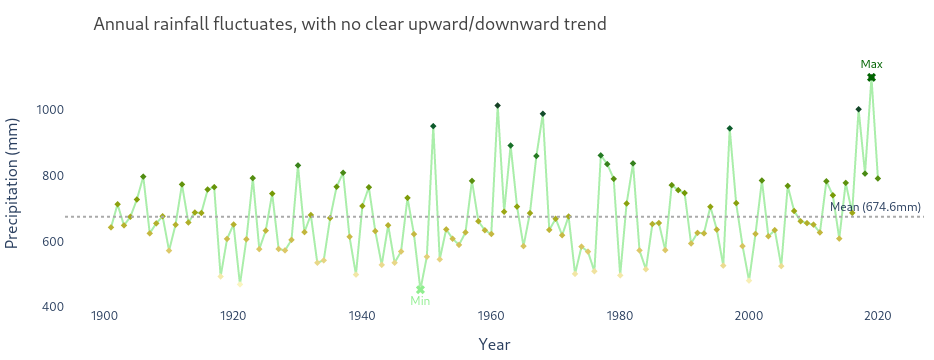

In [6]:
line_plot(precipitation_ts["Kenya"], line_color="#aea", max_color="darkgreen",
          min_color="lightgreen", marker_colorscale="speed", unit="mm",
          hover_text="Annual Rainfall", x_label="Year", y_label="Precipitation (mm)", 
          title="Annual rainfall fluctuates, with no clear upward/downward trend")

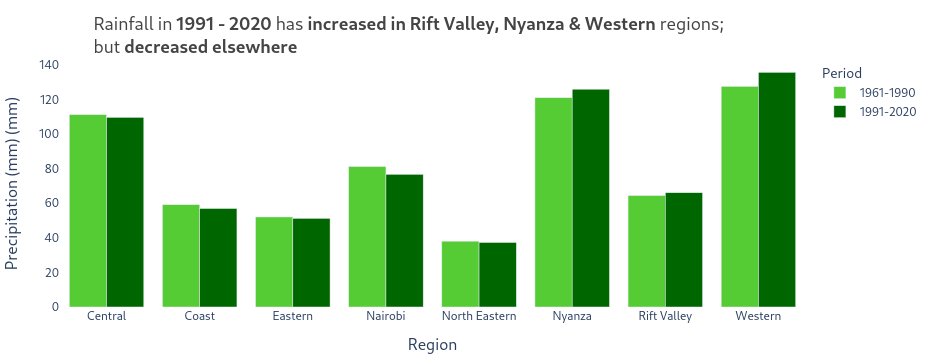

In [7]:
precip_climate = precipitation_climatology.stack().groupby(level=0).mean()
comparative_bar(precip_climate, color_sequence=["#55cc33", "#006600"], unit="mm",
                x_label="Region", y_label="Precipitation (mm)", legend_title_text="Period",
                title=("Rainfall in <b>1991 - 2020</b> has <b>increased in "
                       "Rift Valley, Nyanza & Western</b> regions; <br>but "
                       "<b>decreased elsewhere</b>")
               )

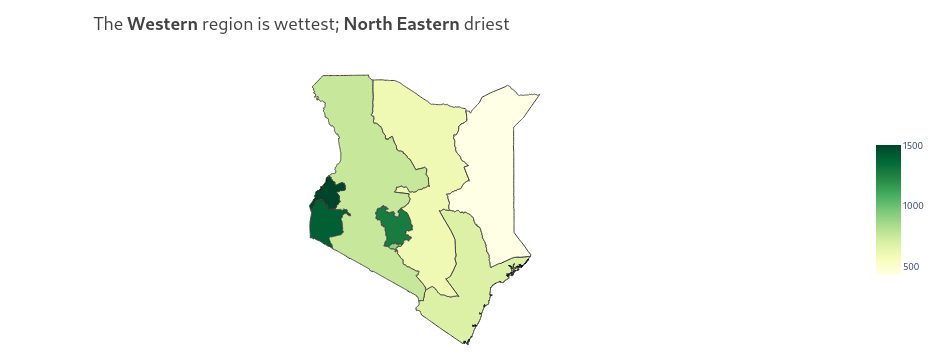

In [8]:
choropleth_map(precipitation_ts.mean(), color_scale="YlGn", unit="mm",
               title=("The <b>Western</b> region is wettest; "
                      "<b>North Eastern</b> driest")
              )

# 3. Trends in Climate

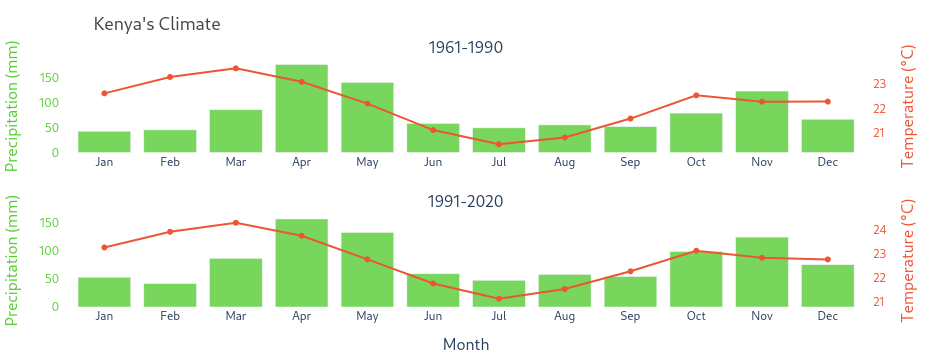

In [9]:
climate_plot(precipitation_climatology, temperature_climatology)